In [ ]:
import warnings
warnings.filterwarnings("ignore", message="pkg_resources is deprecated as an API.*", category=UserWarning)
warnings.filterwarnings("ignore", message="torch.meshgrid: in an upcoming release.*", category=UserWarning)
from panel_segmentation import utils
from panel_segmentation.env import load_env_file, require_env
import glob
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np
import pandas as pd
import folium
import requests
import torch
from mmengine import Config
from mmdet.apis import init_detector, inference_detector
from mmdet.registry import VISUALIZERS
from shapely.geometry import Polygon
import mmcv

load_env_file()
print("Done")

# SOL-Searcher Pipeline

The following example uses the SOL-Searcher pipeline to detect solar panels within a geographic bounding box. First, get the northwest and southeast latitude-longitude coordinates to generate a bounding box around an area. We can then grid the bounding box and pull a set of satellite images.

In [2]:
# Pull an area of images to run through the SOL-Searcher model.
# Use the generate_satellite_imagery_grid() function to do this.
#AVSR1: 34.7803, -118.4244
northwest_lat, northwest_lon =  34.79722530697174, -118.45081297904377
southeast_lat, southeast_lon = 34.76008561663859, -118.40304400421938
#northwest_lat, northwest_lon =  30.304107, -97.708710
#southeast_lat, southeast_lon =  30.299329, -97.697781
google_maps_api_key = require_env("GOOGLE_MAPS_API_KEY")
zoom_level = 19
file_save_folder = "../../../outputs/sol-searcher_data_examples"
preview_grid_image_count = 24
max_grid_tiles_to_download = None  # Set to an int like 250 for quicker iteration.
max_inference_tiles = None  # Set to an int like 250 for faster smoke tests.
geocode_round_decimals = 6
print("Starting grid pull...")
grid_info_list = utils.generateSatelliteImageryGrid(northwest_lat, northwest_lon,
                                                       southeast_lat, southeast_lon,
                                                       google_maps_api_key,
                                                       file_save_folder,
                                                       zoom_level,
                                                       lat_lon_distance=.0014,
                                                       number_allowed_images_taken=(6000 if max_grid_tiles_to_download is None else max_grid_tiles_to_download),
                                                       request_delay_min_seconds=0.0,
                                                       request_delay_max_seconds=0.0)
print(f"Prepared {len(grid_info_list)} grid locations")

Starting grid pull...
Starting satellite grid pull for 1008 tiles with delay range 0.0-0.0 seconds.
Processed 25/1008 tiles; downloaded 0 new, reused 25 existing.
Processed 50/1008 tiles; downloaded 0 new, reused 50 existing.
Processed 75/1008 tiles; downloaded 0 new, reused 75 existing.
Processed 100/1008 tiles; downloaded 0 new, reused 100 existing.
Processed 125/1008 tiles; downloaded 0 new, reused 125 existing.
Processed 150/1008 tiles; downloaded 0 new, reused 150 existing.
Processed 175/1008 tiles; downloaded 0 new, reused 175 existing.
Processed 200/1008 tiles; downloaded 0 new, reused 200 existing.
Processed 225/1008 tiles; downloaded 0 new, reused 225 existing.
Processed 250/1008 tiles; downloaded 0 new, reused 250 existing.
Processed 275/1008 tiles; downloaded 0 new, reused 275 existing.
Processed 300/1008 tiles; downloaded 0 new, reused 300 existing.
Processed 325/1008 tiles; downloaded 0 new, reused 325 existing.
Processed 350/1008 tiles; downloaded 0 new, reused 350 existi

Visualize some of the imagery in the grid as reference.

In [3]:
preview_grid_image_count = min(preview_grid_image_count, len(grid_info_list))
preview_indices = np.linspace(0, len(grid_info_list) - 1,
                              num=preview_grid_image_count,
                              dtype=int)
preview_grid_info_list = [grid_info_list[idx] for idx in preview_indices]
plot = utils.visualizeSatelliteImageryGrid(preview_grid_info_list, file_save_folder)
print(f"Previewing {len(preview_grid_info_list)} of {len(grid_info_list)} tiles")
plt.show()

Previewing 24 of 1008 tiles


Let's load in the SOL-searcher algorithm, run some imagery through it, and visualize the outputs.

Using device: cpu
Loads checkpoint by local backend from path: ../../../panel_segmentation/models/sol_searcher_model.pth
Running inference on 1008 tiles


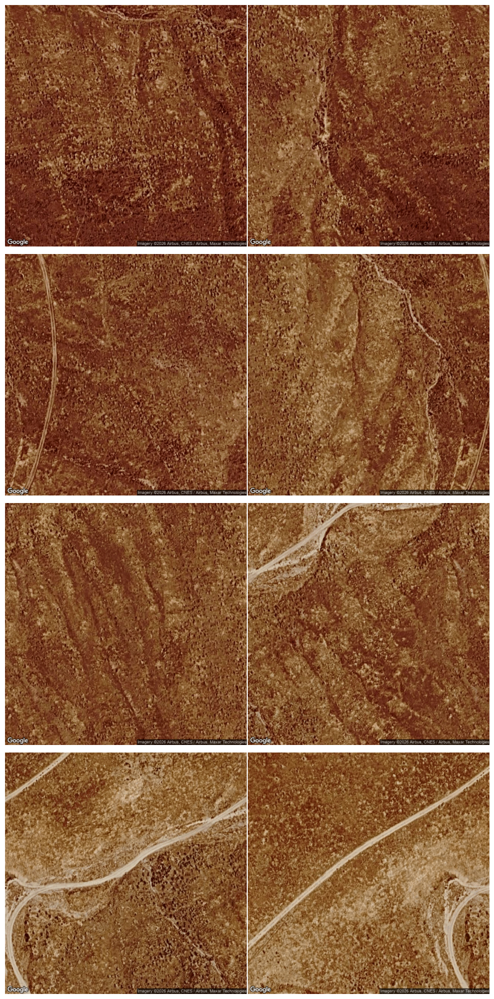

In [4]:
cfg = Config.fromfile("../../../panel_segmentation/models/sol_searcher_config.py")
checkpoint_file = "../../../panel_segmentation/models/sol_searcher_model.pth"
# Alias legacy NumPy module paths that appear inside this checkpoint.
# MMDetection will still call torch.load() internally, so the aliases must
# exist in sys.modules before init_detector() loads the checkpoint.
import importlib
import sys
sys.modules.setdefault("numpy._core", importlib.import_module("numpy.core"))
sys.modules.setdefault("numpy._core.multiarray", importlib.import_module("numpy.core.multiarray"))
sys.modules.setdefault("numpy._core.numeric", importlib.import_module("numpy.core.numeric"))
sys.modules.setdefault("numpy._core._multiarray_umath", importlib.import_module("numpy.core._multiarray_umath"))
# Let MMDetection load the checkpoint instead of manually unpickling it.
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
model = init_detector(cfg, checkpoint_file, device=device)
visualizer = VISUALIZERS.build(model.cfg.visualizer)

# Visualize the first n images in example
n_images = 8
grid_files = sorted(glob.glob(os.path.join(file_save_folder, "*.png")))
if max_inference_tiles is not None:
    grid_files = grid_files[:max_inference_tiles]
print(f"Running inference on {len(grid_files)} tiles")
n_images = min(n_images, len(grid_files))
fig, axes = plt.subplots(((max(n_images, 1) + 1) // 2), 2, figsize=(10, 20))
axes = np.atleast_1d(axes).ravel()

# Run inference on the example images
results = list()
for i, file in enumerate(grid_files):
    img = mmcv.imread(file, channel_order='rgb')
    new_result = inference_detector(model, img)
    new_result.file = file
    results.append(new_result)
    # Visualize n images
    if i < n_images:
        visualizer.add_datasample(
              file,
              img,
              data_sample=new_result,
              draw_gt=None,
              wait_time=0,
              pred_score_thr=0.35
              )
        img = visualizer.get_image()
        axes[i].imshow(img)
        axes[i].axis('off')
for ax in axes[n_images:]:
    ax.axis('off')
plt.tight_layout()
plt.show()

Filter out the inference results with low prediction scores to reduce invalid detections and api queries.

In [5]:
filtered_results = []
for result in results:
    # Filter out inferences with prediction scores lower than 0.15
    if hasattr(result, "pred_instances"):
        save_inference = result.pred_instances.scores > 0.15
        result.pred_instances = result.pred_instances[save_inference]
    filtered_results.append(result)

Let's visualize some of the result outputs from the model.

In [6]:
# Loop through each inference result and get the lat-lon coordinates of the centroid of the box outputs
solar_location_list = list()
for result in filtered_results:
    file_name = os.path.basename(result.file)
    img_center_lat, img_center_lon = float(file_name.split("_")[0]), float(file_name.split("_")[-1].replace(".png", ""))
    image_x_pixels, image_y_pixels = result.img_shape
    boxes = result.pred_instances.bboxes
    for box in boxes:
        np_box = list(box.numpy())
        box_lat, box_lon = utils.getInferenceBoxLatLonCoordinates(np_box, img_center_lat, img_center_lon,
                                                                  image_x_pixels, image_y_pixels,
                                                                  zoom_level)
        solar_location_list.append((box_lat, box_lon))

If we want to associate individual installations to specific buildings, we can use Google's geocoding API to get individual addresses for each PV installation.

In [ ]:
solar_install_address_list = list()
unique_solar_locations = sorted({
    (round(float(latitude), geocode_round_decimals),
     round(float(longitude), geocode_round_decimals))
    for latitude, longitude in solar_location_list
})
print(f"Geocoding {len(unique_solar_locations)} unique locations from {len(solar_location_list)} detections")
geocode_session = requests.Session()
for latitude, longitude in unique_solar_locations:
    # Look up the address associated with lat-lon coordinate
    solar_install_address = utils.generateAddress(float(latitude),
                                                  float(longitude),
                                                  google_maps_api_key,
                                                  request_session=geocode_session)
    solar_install_address_list.append({"latitude": latitude,
                                       "longitude": longitude,
                                       "address": solar_install_address})

Geocoding 5815 unique locations from 5820 detections


 We can then take the median lat-lon coordinates by address as our main address-level lat-lon coordinates, and visualize the resulting dataframe.

In [ ]:
solar_address_df = pd.DataFrame(solar_install_address_list)
solar_address_df['median_latitude_address'] = solar_address_df.groupby("address")['latitude'].transform('median')
solar_address_df['median_longitude_address'] = solar_address_df.groupby("address")['longitude'].transform('median')
# Sort by address
solar_address_df = solar_address_df.sort_values(by='address')
solar_address_df.head(10)

Using aggregated address data, map the addresses containing solar installations in Folium. Please note, this map may include older satellite imagery and there may be discrepancies if solar installs are present in newer scans from Google Maps (i.e. solar was recently installed). Outputs of this algorithm should be manually reviewed to determine if there any discrepancies.

In [ ]:
solar_address_df_agg = solar_address_df[['address',
                                         'median_latitude_address',
                                         'median_longitude_address']].drop_duplicates()

# Create folium map to visualize the solar addresses
folium_map = folium.Map(location=[solar_address_df_agg['median_latitude_address'].mean(),
                                  solar_address_df_agg['median_longitude_address'].mean()],
                        tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                        attr = 'Esri',
                        name = 'Esri Satellite',
                        zoom_start=15,
                        max_zoom=19)
solar_feature_group = folium.FeatureGroup(name="solar", show=True)
for idx, row in solar_address_df_agg.iterrows():
    lat = row['median_latitude_address']
    lon = row['median_longitude_address']
    folium.CircleMarker([lat, lon],
                        color='b',
                        weight=.05,
                        fill=True,
                        fill_opacity=0.6,
                        fill_color='red',
                        radius=3).add_to(solar_feature_group)

folium_map.add_child(solar_feature_group)
folium_map

In [ ]:
print("tiles:", len(grid_info_list))
print("raw results:", len(results))
print("filtered results:", len(filtered_results))
print("solar points:", len(solar_location_list))
print("unique addresses:", len(solar_address_df_agg))
solar_address_df_agg.head()
